# Matplotlib basics - part 2.

This notebook stands for the second part of introduction to and presentation of Matplotlib - absolute fundamentals of plotting in Python.

In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

### 3D plots

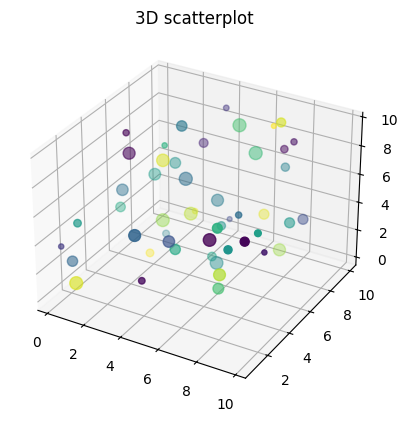

In [2]:
n_points= 50
x = np.random.uniform(0, 10, n_points)
y = np.random.uniform(0, 10, n_points)
z = np.random.uniform(0, 10, n_points)

sizes = np.random.uniform(10, 90, n_points)
colors = np.random.uniform(1, 9, n_points)

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
ax.set_title("3D scatterplot")

plot = ax.scatter(x, y, z, c=colors, s=sizes)

In [3]:
plot

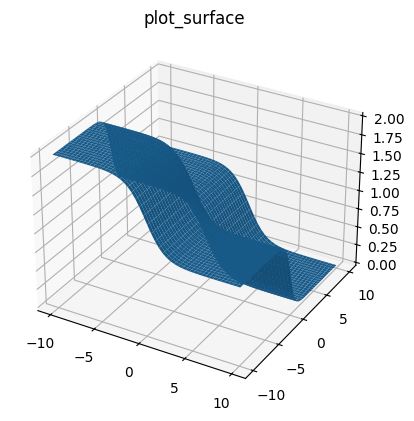

In [4]:
X, Y = np.meshgrid(np.linspace(-10, 10), np.linspace(-10, 10))
Z = 1/(1 + np.exp(X)) + 1/(1 + np.power(np.exp(Y),2))

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
ax.set_title("plot_surface")

plot = ax.plot_surface(X, Y, Z)

In [5]:
plot

3D barplot (e.g. 3D histogram)

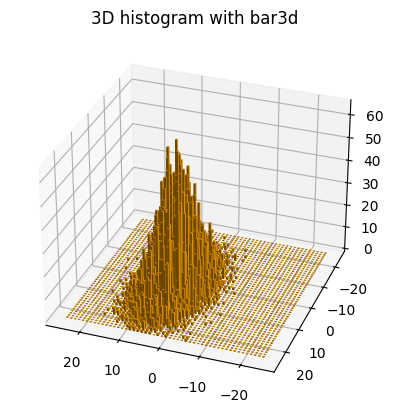

In [6]:
x = np.random.normal(5, 4, size=10_000)
y = np.random.normal(3, 8, size=10_000)

hist, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[-25, 25], [-25, 25]])
xpos, ypos = np.meshgrid(xedges[:-1] + 0.5, yedges[:-1] + 0.5, indexing="ij")
xpos = xpos.ravel()
ypos = ypos.ravel()
zpos = 0
dx = dy = 0.5 * np.ones_like(zpos)
dz = hist.ravel()

fig, ax = plt.subplots(subplot_kw={'projection': '3d'})
ax.set_title("3D histogram with bar3d")
ax.view_init(30, 110)  # change view angle
plot = ax.bar3d(xpos, ypos, zpos, dx, dy, dz, zsort='average', color='orange')

In [7]:
plot

### Animations

Matplotlib provides tools to create animations - series of frames, and each frame is one plot.

There are two ways of creating animations in Matplotlib:

- with `FuncAnimation` - provide function that obtaines subsequent frames
- with `ArtistAnimation` - provide sequence of ready plots (frames)

In [8]:
import matplotlib.animation as animation
from IPython.display import HTML

Example of `FuncAnimation` usage:

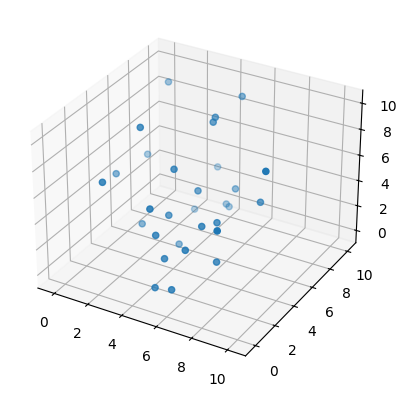

In [10]:
T = 20
n_points = 30
n_frames = 100

omega = 2 * np.pi / T

# cube's edge
edge = 10

# initial coordinates of points
x = np.random.uniform(low=0, high=10, size=n_points)
y = np.random.uniform(low=0, high=10, size=n_points)
z = np.random.uniform(low=0, high=10, size=n_points)
points = np.stack([x, y, z]).T

# deviation amplitude for each point
deviations = np.random.uniform(low=-1.5, high=1.5, size=(n_points, 3))

# initial plot
fig, ax = plt.subplots(subplot_kw={'projection':'3d'})
ax.set_xlim(-1, edge+1)
ax.set_ylim(-1, edge+1)
ax.set_zlim(-1, edge+1)
scat = ax.scatter(points[:,0], points[:,1], points[:,2])

# function to create subsequent frames
# `frame` is the number of frame
def update(frame):
    # calculate points positions in the frame
    current_points = points + deviations * np.sin(omega*frame)
    scat._offsets3d = (
        current_points[:,0],
        current_points[:,1],
        current_points[:,2],
    )
    return scat

ani = animation.FuncAnimation(fig=fig, func=update, frames=n_frames, interval=30)
HTML(ani.to_jshtml())

Example of `ArtistAnimation` usage:

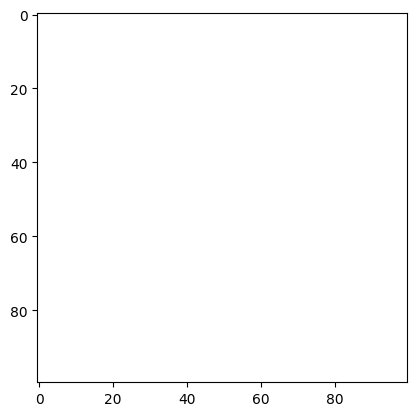

In [11]:
fig, ax = plt.subplots()

artists = []
for i in range(100):
    plot = ax.imshow(np.random.rand(100, 100))
    # artist argument is list and each entry must be
    # a COLLECTION of Artist objects
    artists.append([plot])

ani = animation.ArtistAnimation(fig=fig, artists=artists, interval=30)
HTML(ani.to_jshtml())

### Tips for visualization creators

Use _alpha_ parameter to make overlapped part of plot visible.

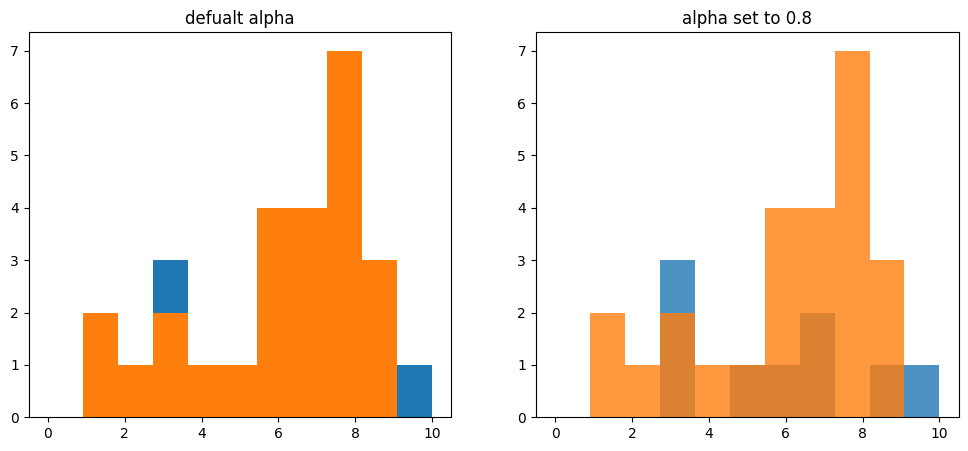

In [12]:
n_bins=11
hist_range = (0, 10)
alpha = 0.8

data_class_1 = np.array(
    [3.5] * 3 + [5., 6.] + [7.]*2 + [9., 9.9]
)
data_class_2 = np.array(
    [1., 2., 3., 3.5, 4.5, 5., 1.] + [6.,7.,8.] * 4 + [8.,9.] * 3
)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[1].set_alpha(0.5)

axes[0].hist(data_class_1, bins=n_bins, range=hist_range)
axes[0].hist(data_class_2, bins=n_bins, range=hist_range)
axes[0].set_title("defualt alpha")

axes[1].hist(data_class_1, bins=n_bins, range=hist_range, alpha=alpha)
axes[1].hist(data_class_2, bins=n_bins, range=hist_range, alpha=alpha)
axes[1].set_title(f"alpha set to {alpha}")

plt.show()

Think again before you use simple yellow color on your plots. Aggresive red may also not be a good idea.

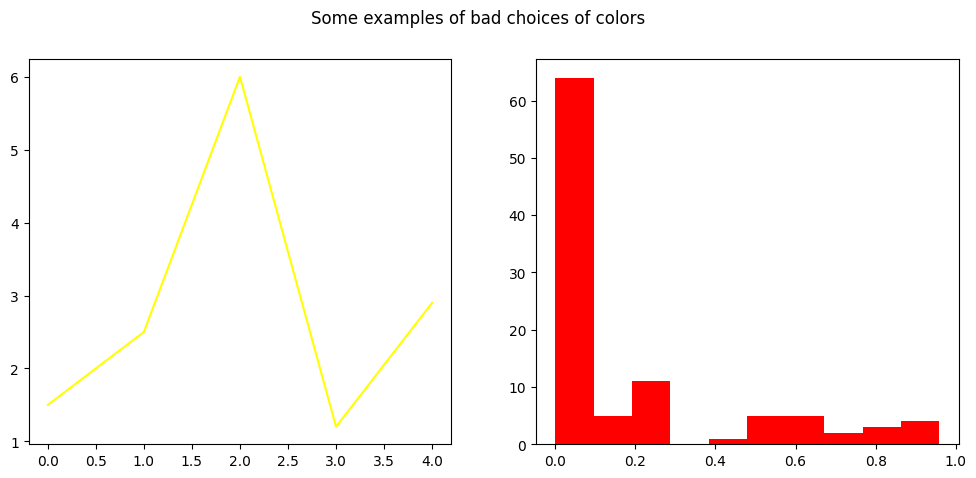

In [13]:
y_vals = [1.5, 2.5, 6, 1.2, 2.9]
some_data = np.random.beta(0.2, 0.7, size=100)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("Some examples of bad choices of colors")
axes[0].plot(y_vals, c='#FFFF00')
axes[1].hist(some_data, color='red')

plt.show()

Don't hesitate to use log-scale y axis when your data has various orders of magnitude or contains outliers.

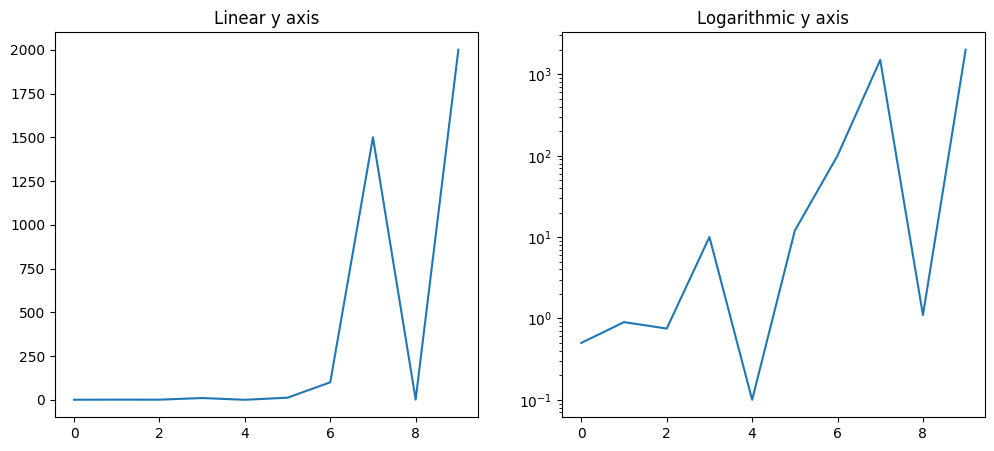

In [14]:
data = np.array(
    [0.5, 0.9, 0.75, 10, 0.1, 12, 100, 1500, 1.1, 2000]
)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].plot(data)
axes[0].set_title("Linear y axis")

axes[1].plot(data)
axes[1].set_yscale('log')
axes[1].set_title("Logarithmic y axis")

plt.show()